In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Task 1

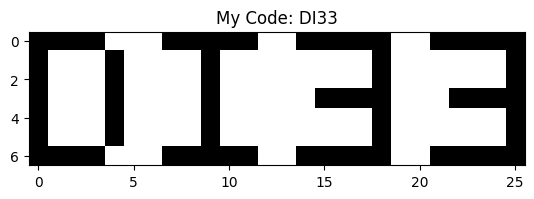

In [ ]:
char_height = 7
char_width = 5
spacing = 2

# a white canvas to hold all four characters
total_width = (4  * char_width) + (3 * spacing)
code = np.full((char_height, total_width), 255)

# each character is a slice of the main canvas array , changing values from 255 to 0, we can draw on the canvas.
d = np.array([
    [0, 0, 0, 0, 255],
    [0, 255, 255, 255, 0],
    [0, 255, 255, 255, 0],
    [0, 255, 255, 255, 0],
    [0, 255, 255, 255, 0],
    [0, 255, 255, 255, 0],
    [0, 0, 0, 0, 255]
])
i = np.array([
        [0, 0, 0, 0, 0],
    [255, 255, 0, 255, 255],
    [255, 255, 0, 255, 255],
    [255, 255, 0, 255, 255],
    [255, 255, 0, 255, 255],
    [255, 255, 0, 255, 255],
        [0, 0, 0, 0, 0]
])
three = np.array([
            [0, 0, 0, 0, 0],
    [255, 255, 255, 255, 0],
    [255, 255, 255, 255, 0],
          [255, 0, 0, 0, 0],
    [255, 255, 255, 255, 0],
    [255, 255, 255, 255, 0],
            [0, 0, 0, 0, 0]
])
code[0:7, 0:5] = d #every letter is 7x5 but the height stays the same as we go towards horizontally
code[0:7, 7:12] = i
code[0:7, 14:19] = three
code[0:7, 21:26] = three

#print(code)
plt.imshow(code, cmap='gray')
plt.title("My Code: DI33")
plt.show()

#Task 2

In [ ]:
base_dir = "/content/drive/MyDrive/Assignment-1/463 Dataset-1/"
resized_dim=(256,256)

In [ ]:
image_list=os.listdir(base_dir)
print(image_list)

['dog3.jpg', 'dog2.jpg', 'tree1.jpg', 'horse2.jpg', 'cat2.jpg', 'cat1.jpg', 'horse3.jpg', 'dog1.jpg', 'horse1.jpg', 'cat3.jpg', 'Crop', 'Rotate', 'Translate', 'Stretch', 'Flip', 'noise', 'Shear']


##Translate
Translation the simple act of shifting an image horizontally, vertically or both without changing its orientation. The primary reason for using translation in ML is to teach a model positional invariance. In the real world an object of interest won't always be perfectly centered in every picture. By training a model on images where the object has been artificially moved to the top or bottom or other positions the model learns that the object's identity doesn't depend on it's location in the frame.

(256, 256, 3)


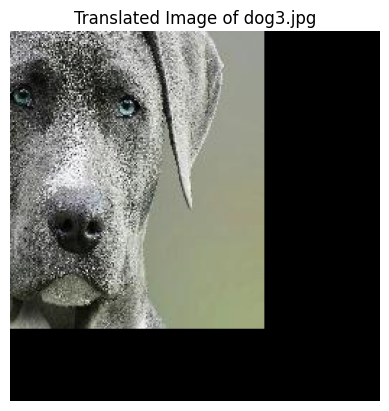

(256, 256, 3)


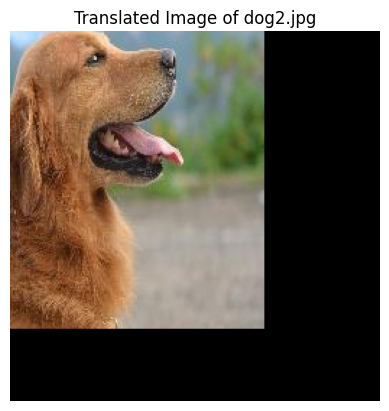

(256, 256, 3)


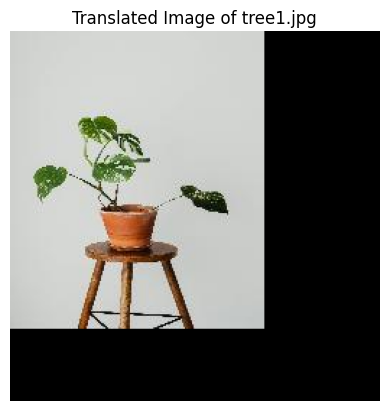

(256, 256, 3)


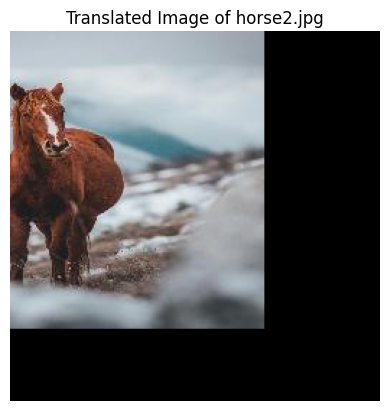

(256, 256, 3)


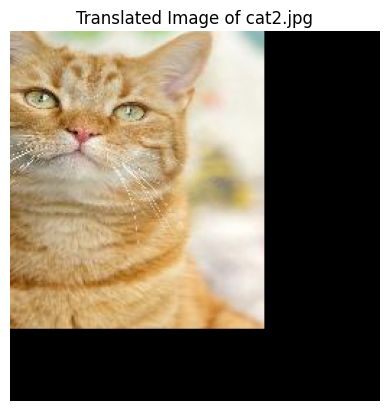

(256, 256, 3)


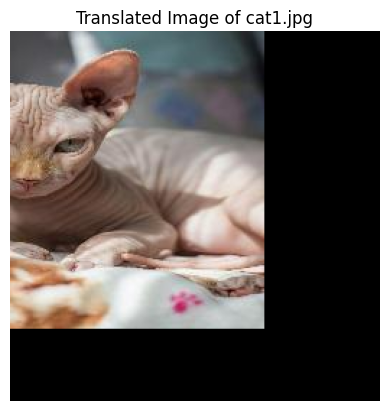

(256, 256, 3)


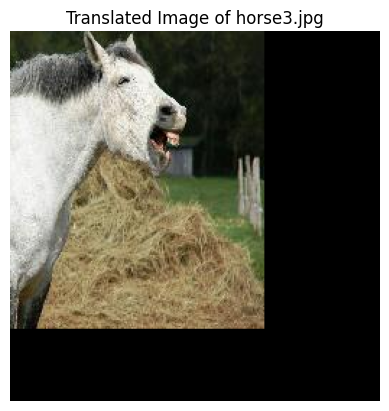

(256, 256, 3)


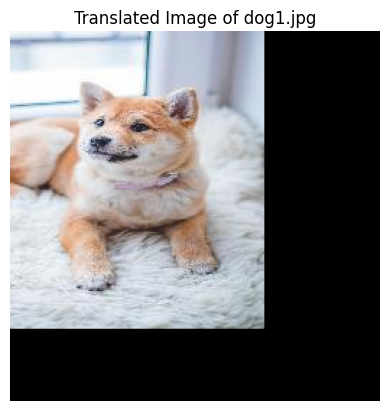

(256, 256, 3)


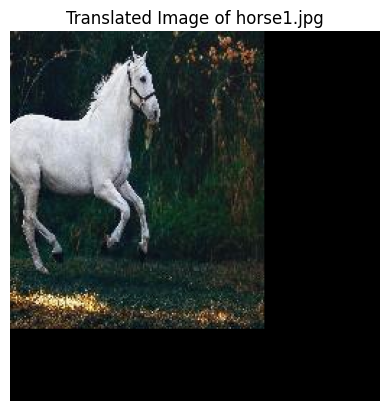

(256, 256, 3)


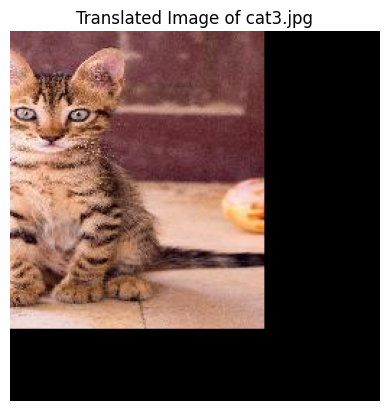

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Translate/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    x=-80
    y=-50
    translation_matrix=np.float32([[1,0,x],[0,1,y]])
    translated_image=cv2.warpAffine(resized_rgb_img, translation_matrix, (resized_rgb_img.shape[1], resized_rgb_img.shape[0]))
    print(translated_image.shape)

    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,translated_image)
    plt.imshow(translated_image)
    plt.title(f"Translated Image of {filename}")
    plt.axis('off')
    plt.show()

##Cropped Images
cropping is the process of selecting and cutting out a specific rectangular portion of an image. It is used to isolate ROI removing distracting backgrounds or irrelevant elements to force a model to focus only on the important features.

(100, 130, 3)


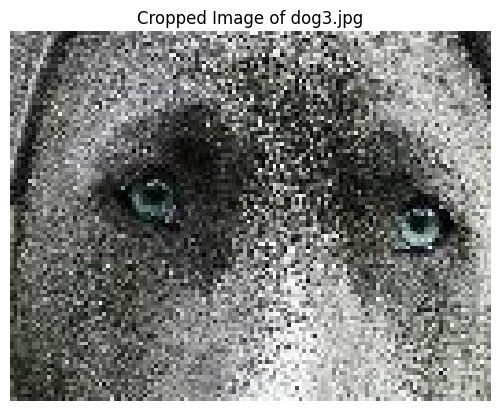

(100, 130, 3)


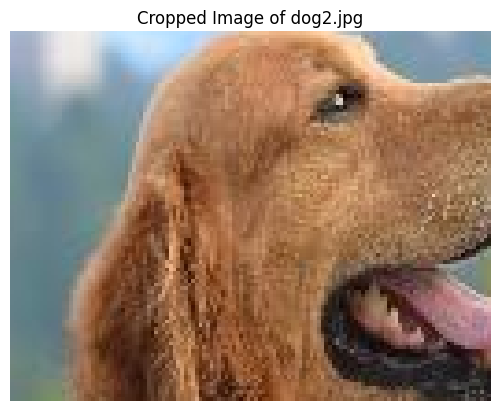

(100, 130, 3)


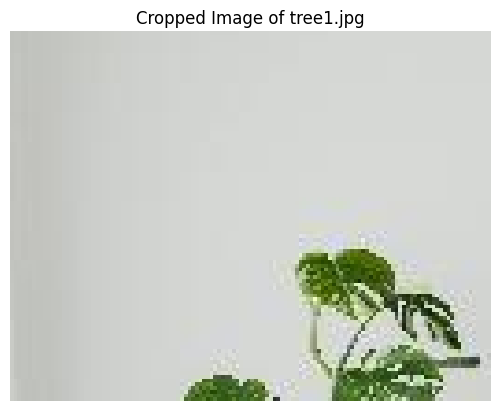

(100, 130, 3)


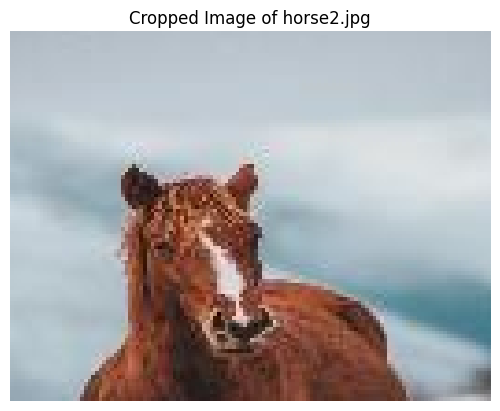

(100, 130, 3)


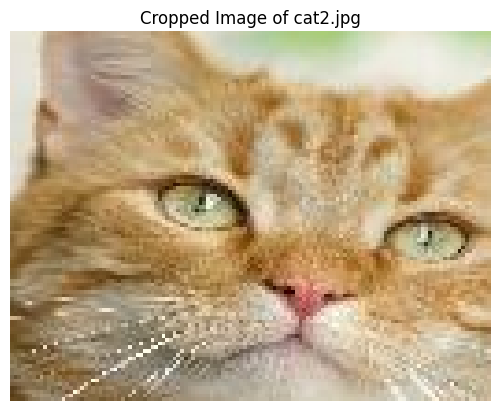

(100, 130, 3)


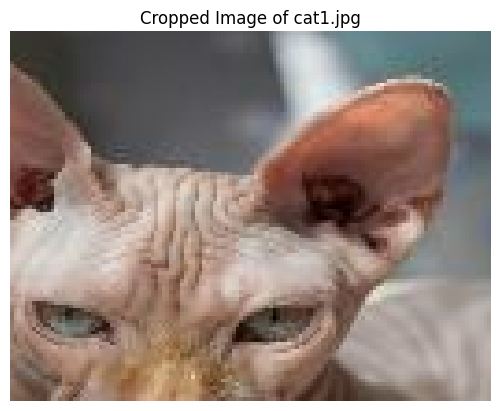

(100, 130, 3)


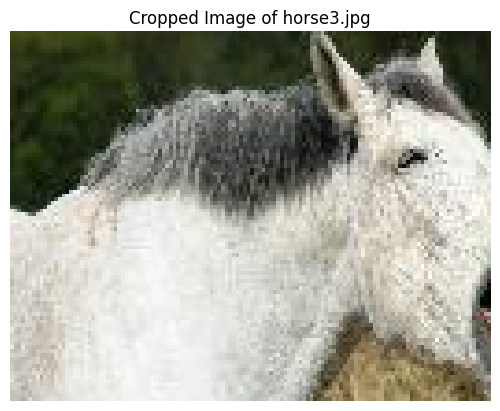

(100, 130, 3)


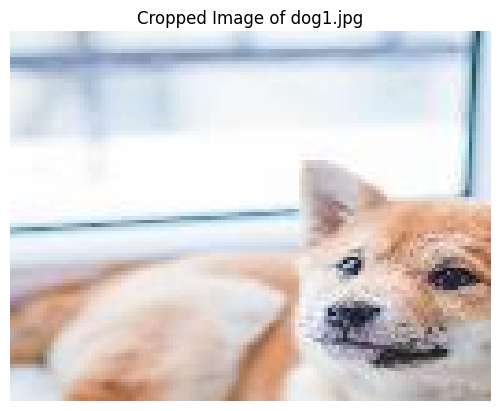

(100, 130, 3)


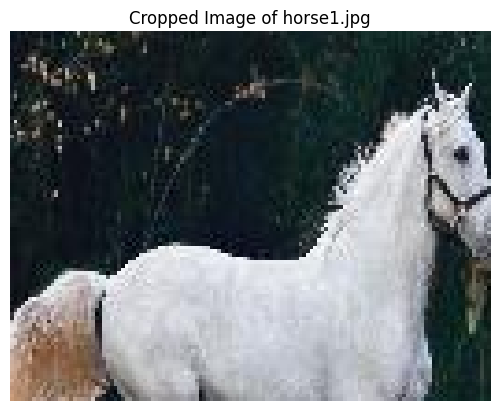

(100, 130, 3)


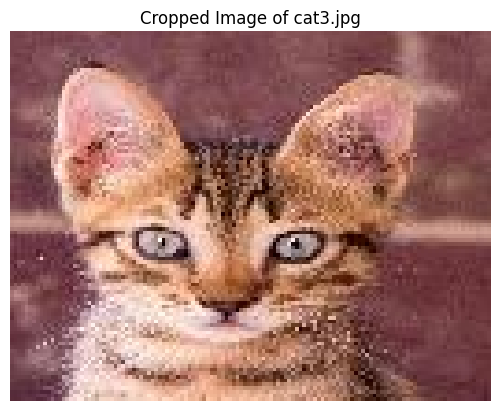

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Crop/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    cropped_image = resized_rgb_img[50:150, 50:180]
    print(cropped_image.shape)
    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,cropped_image)
    plt.imshow(cropped_image)
    plt.title(f"Cropped Image of {filename}")
    plt.axis('off')
    plt.show()

##Flip Images
Flipping creates a mirror image of the original across a horizontal or vertical axis. Horizontal Flipping is used because it preserves the image's realism and Vertical Flipping is used for unrealistic scenarios.

(256, 256, 3)


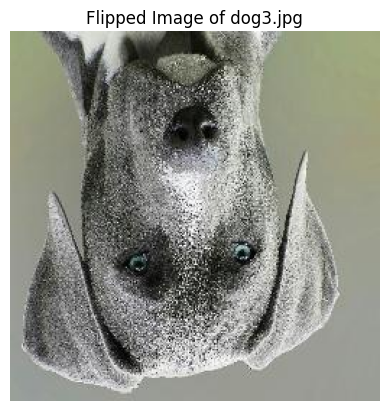

(256, 256, 3)


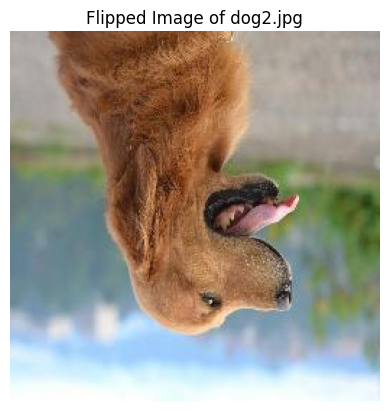

(256, 256, 3)


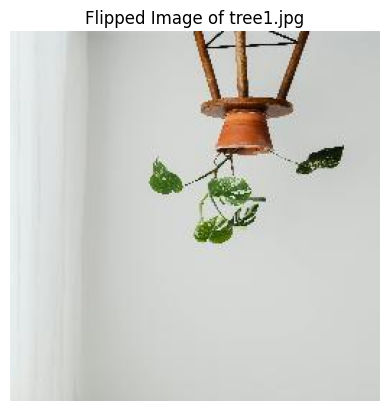

(256, 256, 3)


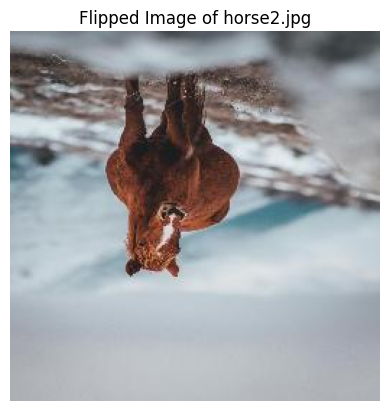

(256, 256, 3)


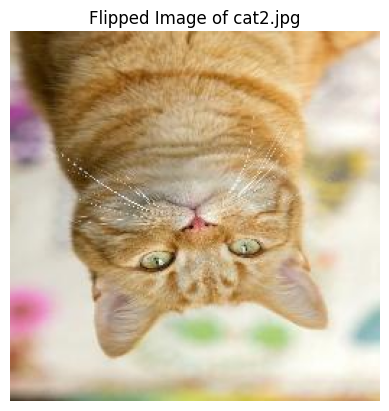

(256, 256, 3)


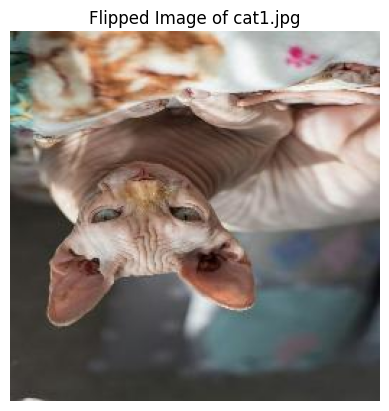

(256, 256, 3)


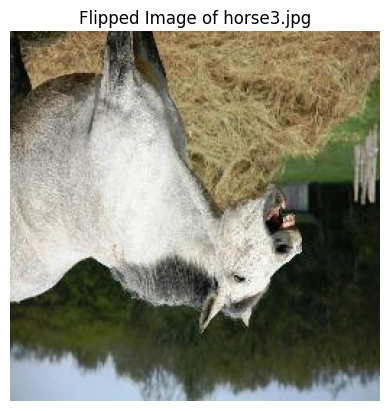

(256, 256, 3)


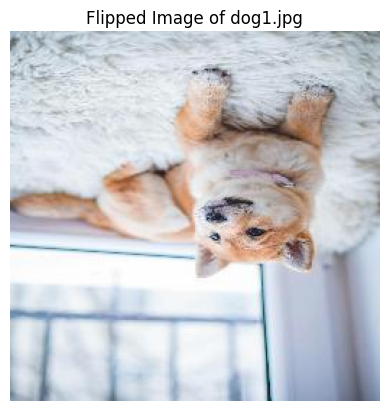

(256, 256, 3)


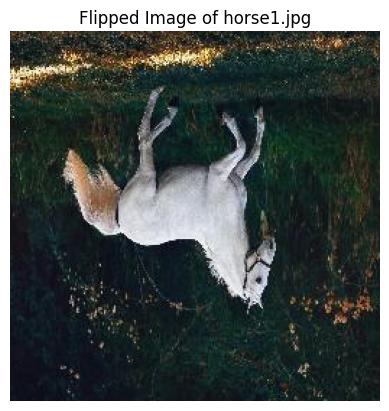

(256, 256, 3)


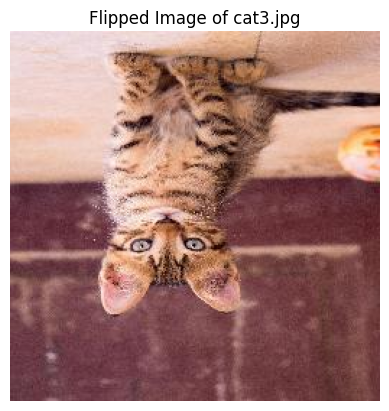

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Flip/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    flipped_image = cv2.flip(resized_rgb_img, 0)
    print(flipped_image.shape)
    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,flipped_image)
    plt.imshow(flipped_image)
    plt.title(f"Flipped Image of {filename}")
    plt.axis('off')
    plt.show()

##Rotated Images
Rotation involves turning an image around central point by a specific angle. This transformation is crucial for teaching a model rotational invariance.For example, a facial recognition system should be able to identify a person even if they tilt their head

(256, 256, 3)


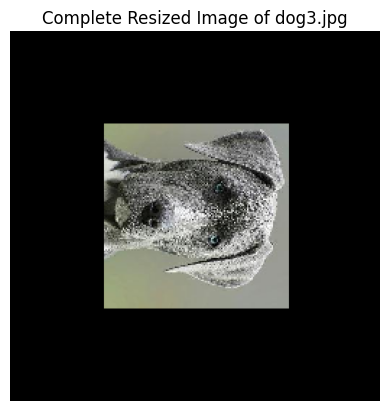

(256, 256, 3)


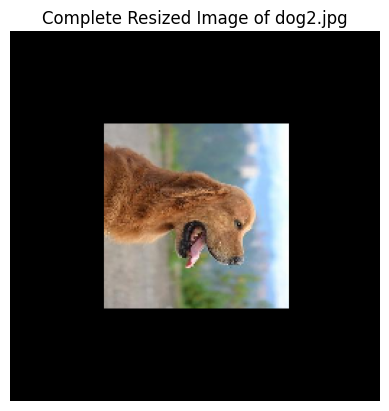

(256, 256, 3)


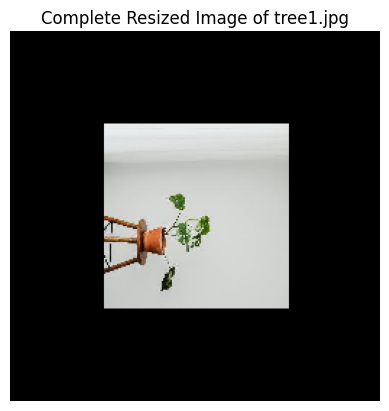

(256, 256, 3)


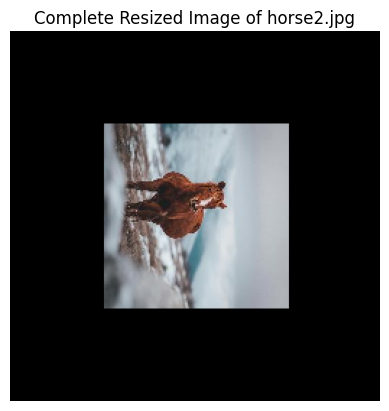

(256, 256, 3)


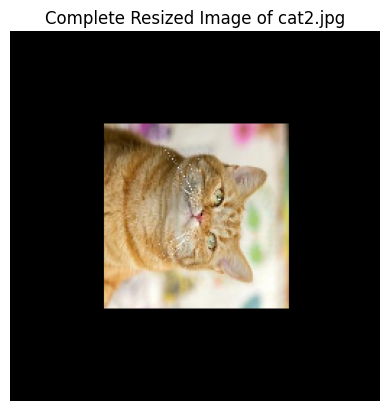

(256, 256, 3)


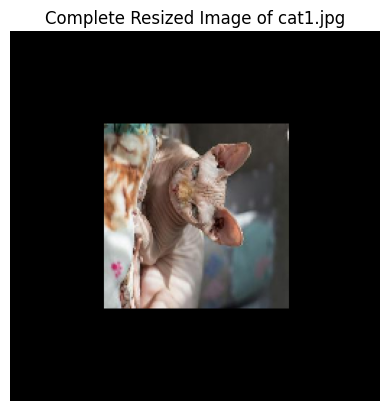

(256, 256, 3)


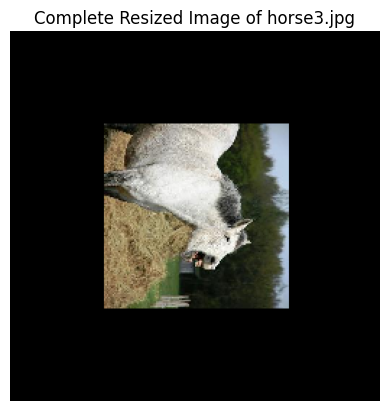

(256, 256, 3)


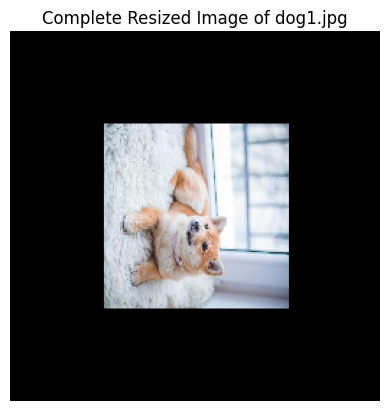

(256, 256, 3)


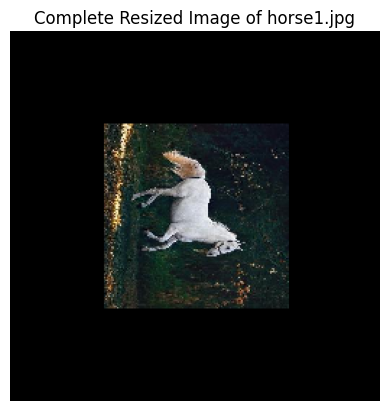

(256, 256, 3)


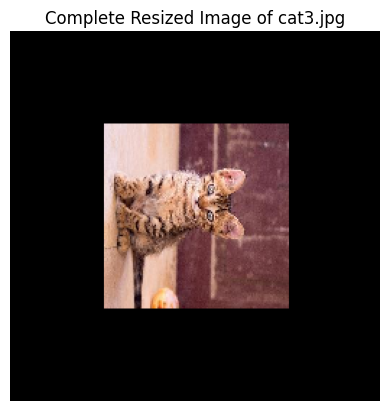

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Rotate/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    rows,cols = img.shape[:2]
    M = cv2.getRotationMatrix2D((cols/2,rows/2),-90,0.5)
    rotated_image= cv2.warpAffine(resized_rgb_img,M,(cols,rows))
    print(rotated_image.shape)
    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,rotated_image)
    plt.imshow(rotated_image)
    plt.title(f"Complete Resized Image of {filename}")
    plt.axis('off')
    plt.show()

##Shearing
A shear transformation skews an image along one axis this effect follows a change in the viewing angle or perspective. It is particularlt useful for tasks like optical character recognition as it helps the model recognize characters.

(256, 384, 3)


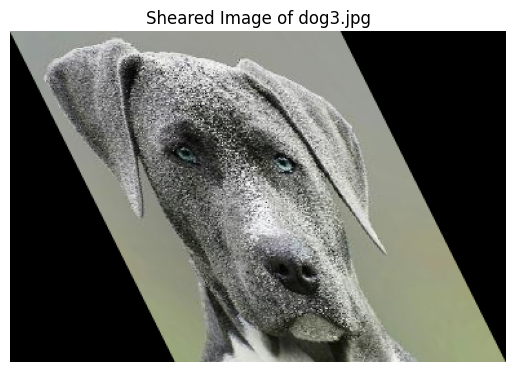

(256, 384, 3)


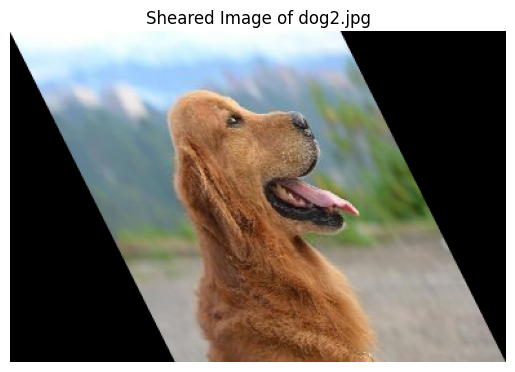

(256, 384, 3)


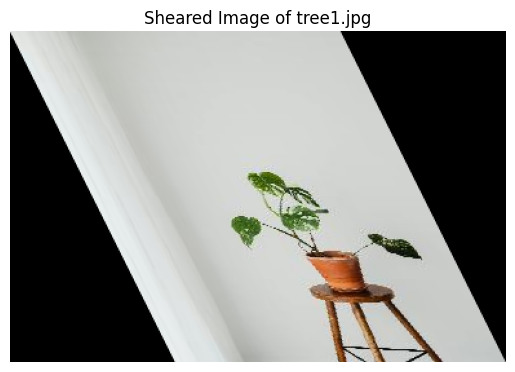

(256, 384, 3)


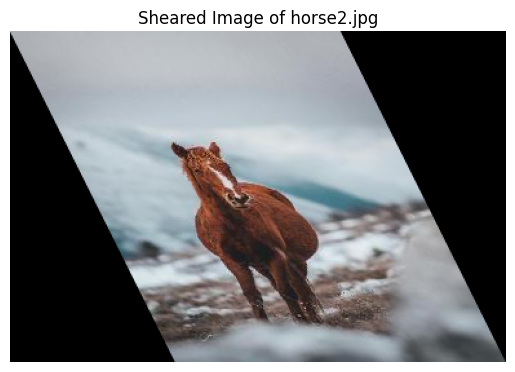

(256, 384, 3)


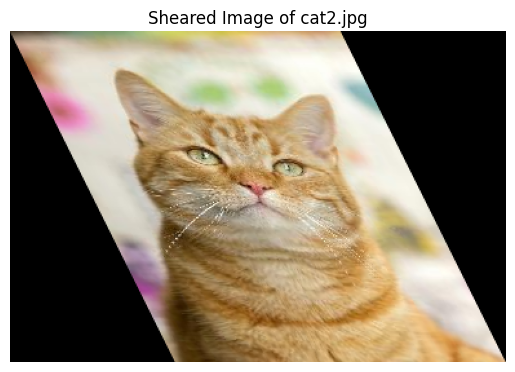

(256, 384, 3)


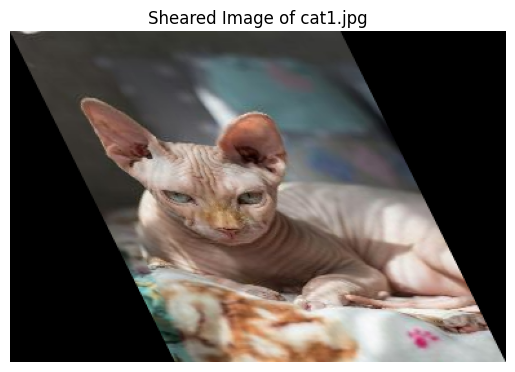

(256, 384, 3)


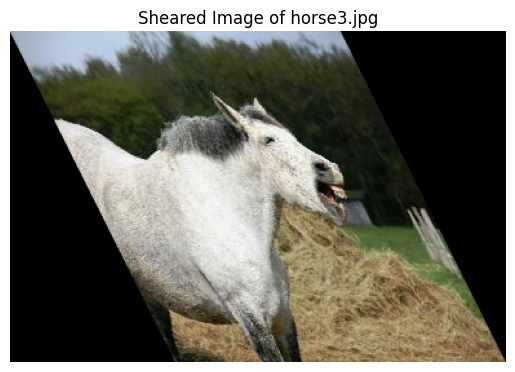

(256, 384, 3)


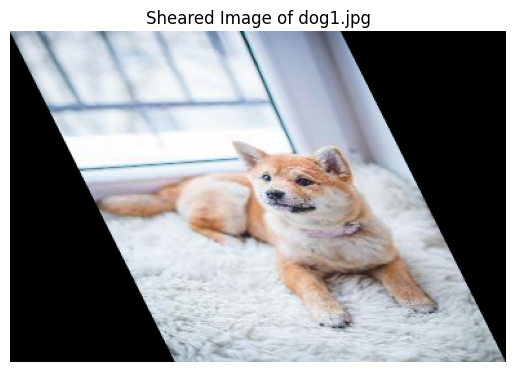

(256, 384, 3)


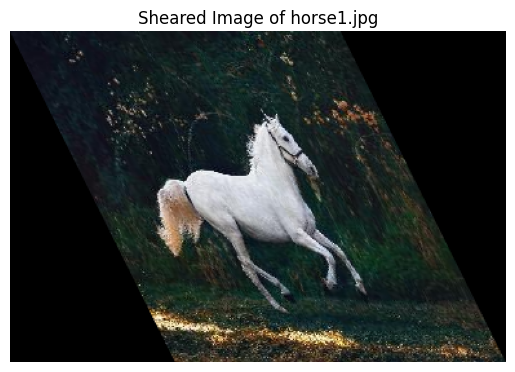

(256, 384, 3)


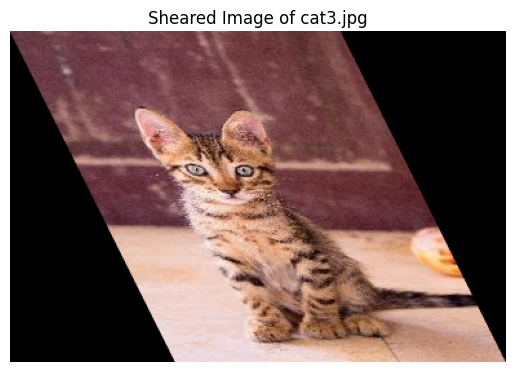

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Shear/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)
    height, width = resized_rgb_img.shape[:2]
    x=.5
    y=0
    shear_matrix = np.float32([
    [1, x, 0],  # Shear along the x-axis
    [y, 1, 0]   # No shear along the y-axis
])
    sheared_image = cv2.warpAffine(resized_rgb_img, shear_matrix, (width + int(x * height), height))
    print(sheared_image.shape)
    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,sheared_image)
    plt.imshow(sheared_image)
    plt.title(f"Sheared Image of {filename}")
    plt.axis('off')
    plt.show()

##Stretching
Stretching also known as scaling or resizing changes the dimensions of an image. It's most critical use is for standardization. Most machine learning models especially CNNs require input images to have a fixed, uniform size so all images must be scaled to these dimensions before being fed into the model. As a data augmentation method, scaling helps a model learn scale invariance by training it on images.

(256, 1280, 3)


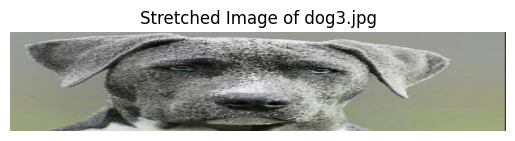

(256, 1280, 3)


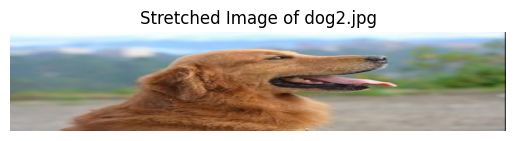

(256, 1280, 3)


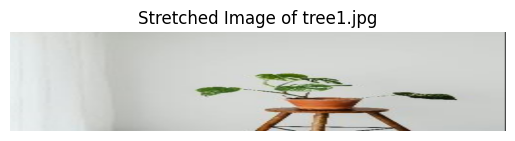

(256, 1280, 3)


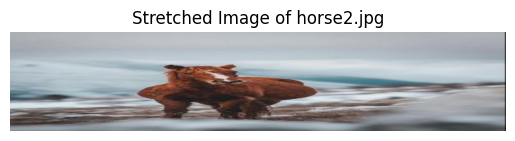

(256, 1280, 3)


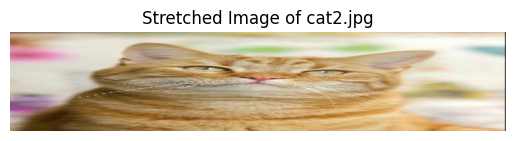

(256, 1280, 3)


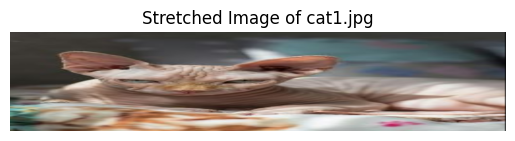

(256, 1280, 3)


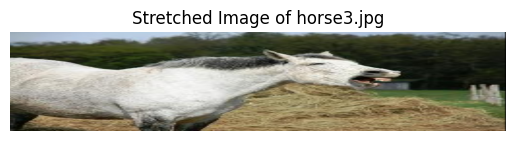

(256, 1280, 3)


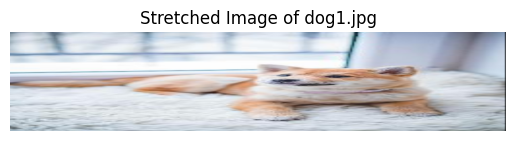

(256, 1280, 3)


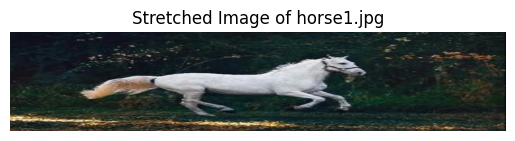

(256, 1280, 3)


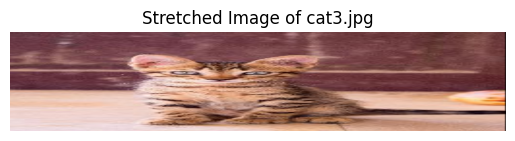

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/Stretch/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    height, width = resized_rgb_img.shape[:2]
    x=5
    y=1
    stretch_matrix = np.float32([
    [x, 0, 0],
    [0, y, 0]])

    stretched_image = cv2.warpAffine(resized_rgb_img, stretch_matrix, (int(width * x), int(height * y)))
    print(stretched_image.shape)
    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,stretched_image)
    plt.imshow(stretched_image)
    plt.title(f"Stretched Image of {filename}")
    plt.axis('off')
    plt.show()

##Random Noise

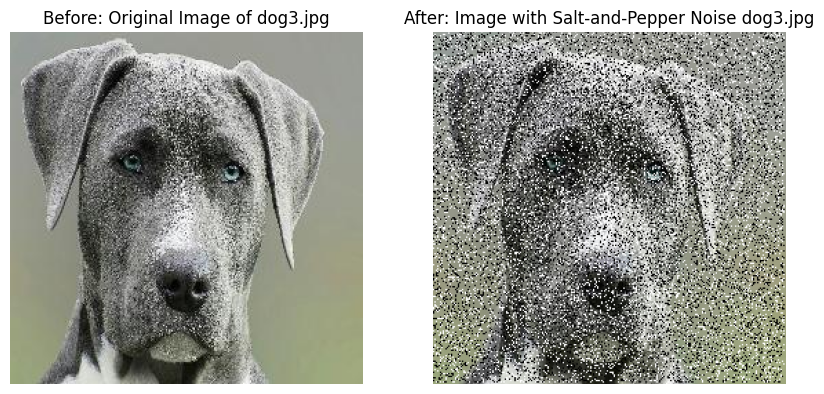

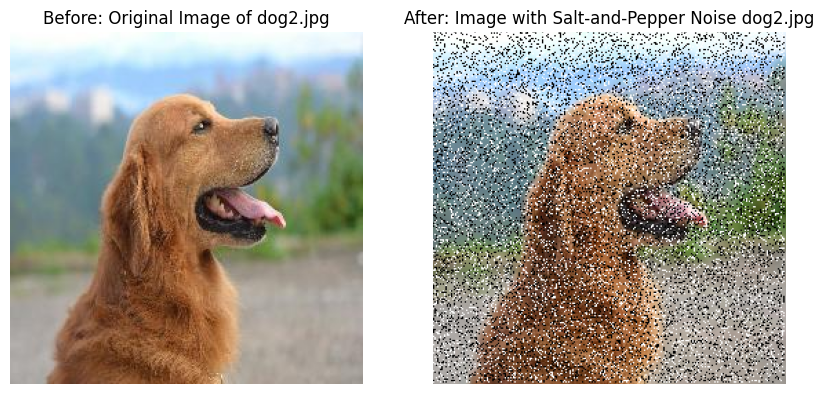

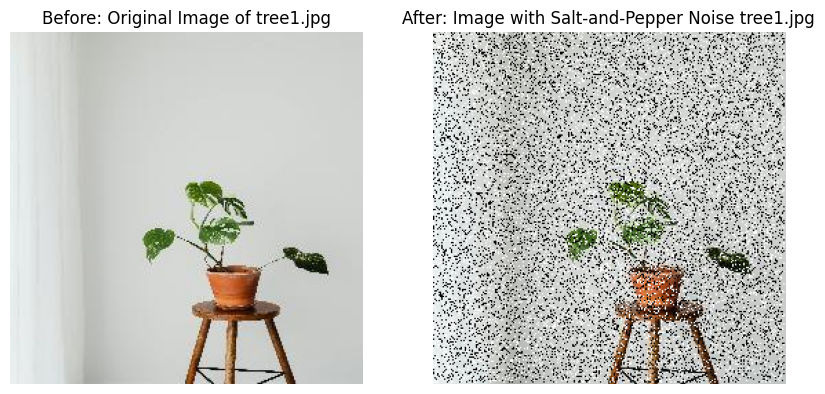

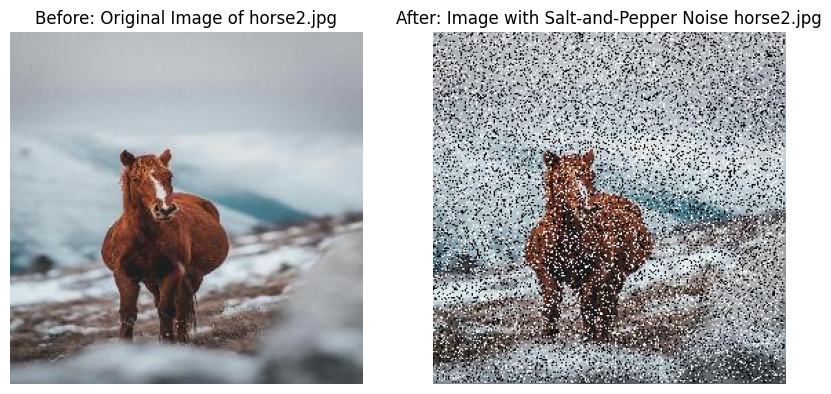

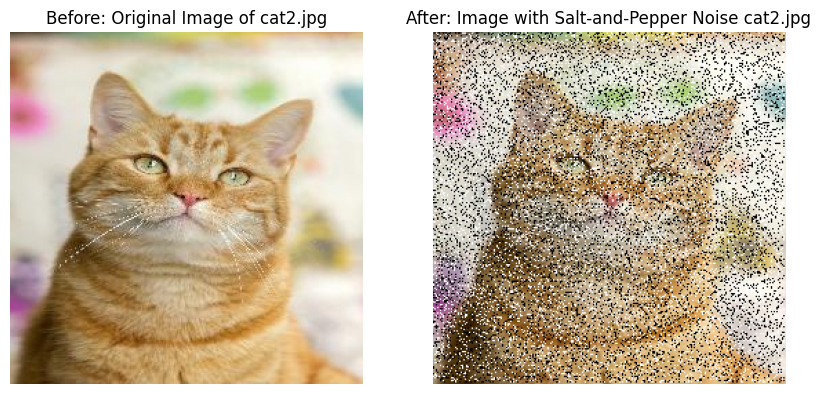

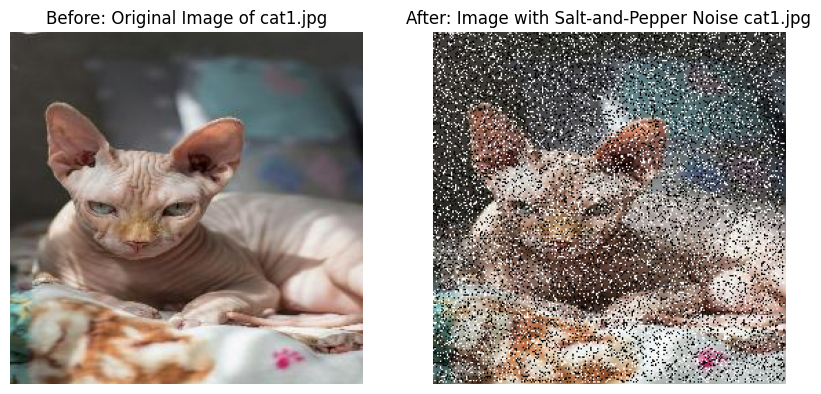

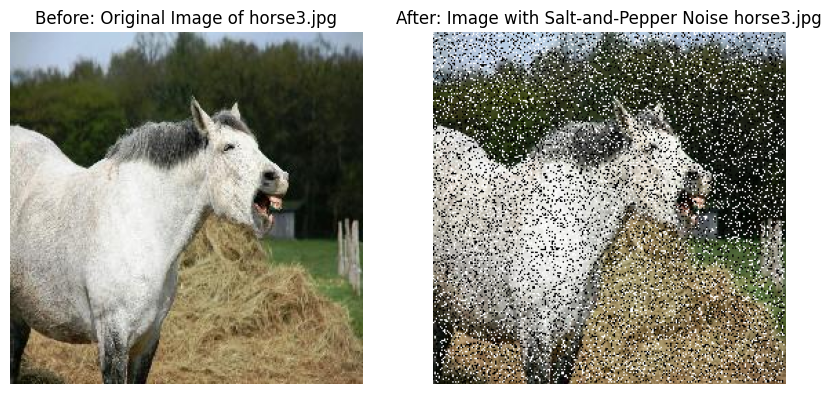

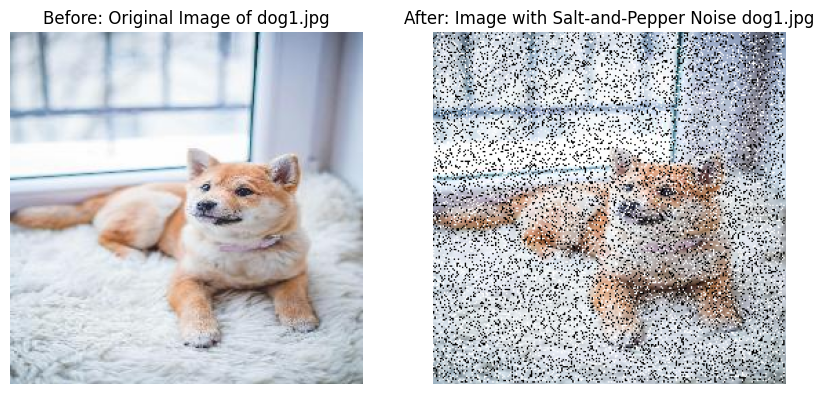

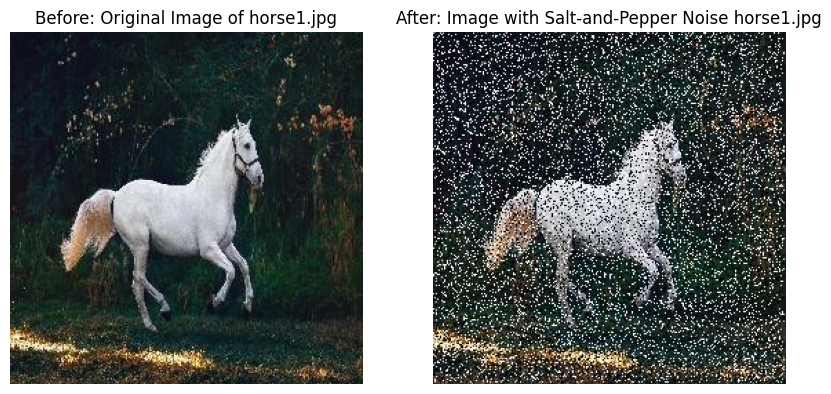

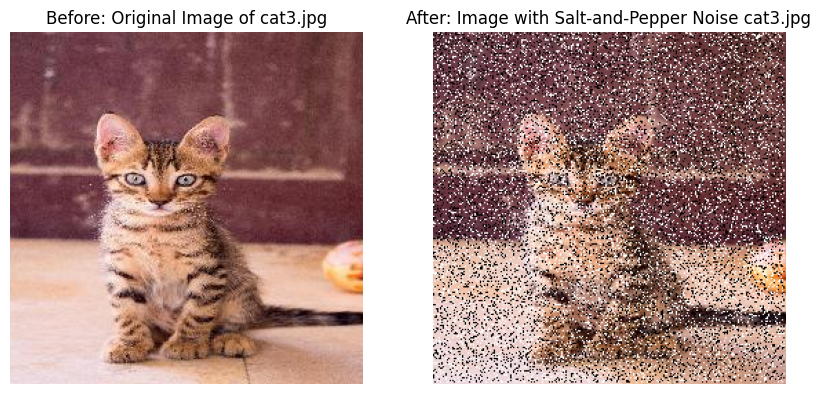

In [ ]:
des_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-1/noise/"
for filename in image_list:
  if filename.endswith(".jpg"):
    img_path=os.path.join(base_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    prob = 0.1

    noisy_image = np.copy(resized_rgb_img)
    num_salt = np.ceil(prob * resized_rgb_img.size * 0.5).astype(int)
    num_pepper = np.ceil(prob * resized_rgb_img.size * 0.5).astype(int)

    coords = [np.random.randint(0, i - 1, num_salt) for i in resized_rgb_img.shape]
    noisy_image[coords[0], coords[1]] = 255


    coords = [np.random.randint(0, i - 1, num_pepper) for i in resized_rgb_img.shape]
    noisy_image[coords[0], coords[1]] = 0

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(resized_rgb_img)
    plt.title(f"Before: Original Image of {filename}")
    plt.axis('off')

    des_path=os.path.join(des_dir,filename)
    plt.imsave(des_path,noisy_image)
    plt.subplot(1, 2, 2)
    plt.imshow(noisy_image)
    plt.title(f"After: Image with Salt-and-Pepper Noise {filename}")
    plt.axis('off')

    plt.show()

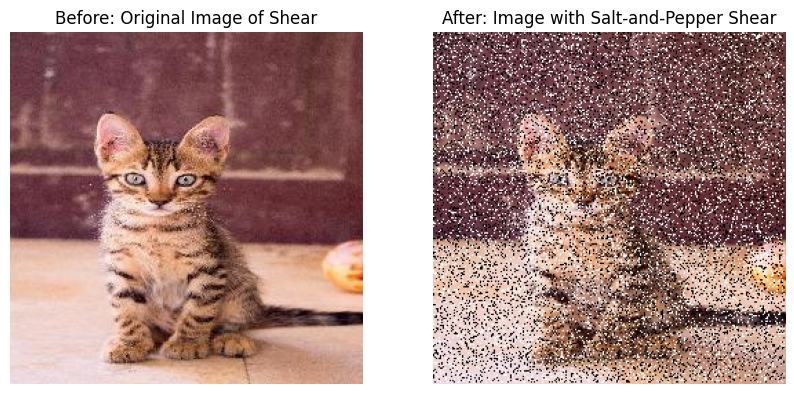

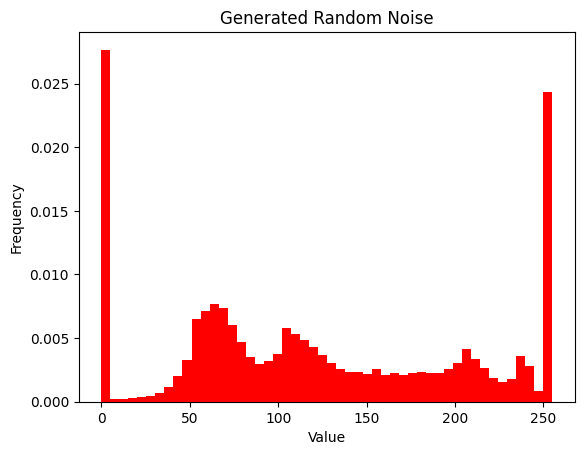

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(resized_rgb_img)
plt.title(f"Before: Original Image of {filename}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title(f"After: Image with Salt-and-Pepper {filename}")
plt.axis('off')

plt.show()
plt.hist(noisy_image.flatten(), bins=50, density=True, alpha=1, color='r')
plt.title('Generated Random Noise')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

#Task 3

In [ ]:
main_dir = "/content/drive/MyDrive/Assignment-1/463 Dataset-2/"
resize_dim=(256,256)
image_list2=os.listdir(main_dir)
print(image_list2)

['nature5.jpg', 'nature4.jpg', 'nature3.jpg', 'nature2.jpg', 'nature1.jpg', 'Noise']


In [ ]:
destinaton_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-2/Noise"
images=[]
for filename in image_list2:
  if filename.endswith(".jpg"):
    img_path=os.path.join(main_dir,filename)
    img=cv2.imread(img_path)
    if img is None:
      print("Failed to load",{filename})
      continue
    resized_img=cv2.resize(img,resized_dim)
    resized_rgb_img=cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)
    images.append(resized_rgb_img)



##Collage of Blending Images

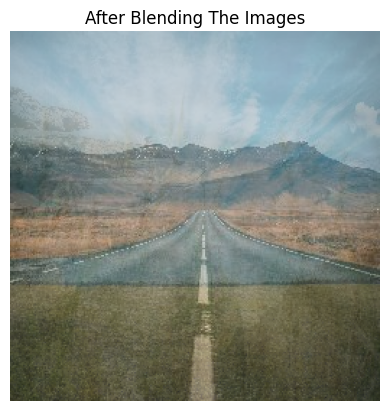

In [ ]:
alphas = [0.55, 0.1, 0.2, 0.05,0.1]
result =alphas[0]*images[0]+alphas[1]*images[1]+alphas[2]*images[2]+alphas[3]*images[3] +alphas[4]*images[4]
plt.imshow(result.astype(np.uint8))
plt.title("After Blending The Images")
plt.axis("off")
plt.show()

##Gaussian Noise

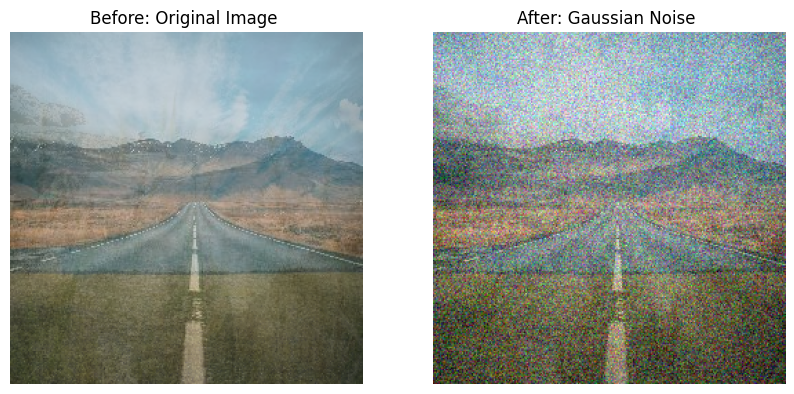

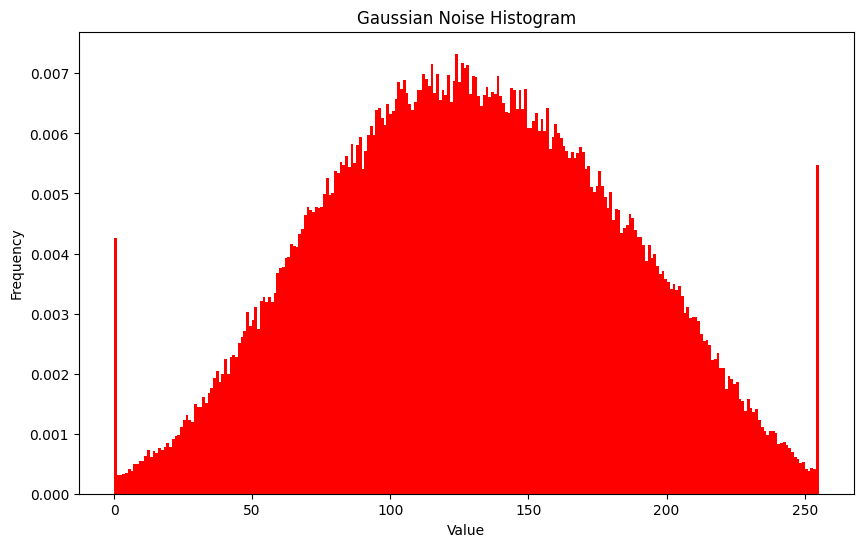

In [ ]:
destinaton_dir="/content/drive/MyDrive/Assignment-1/463 Dataset-2/Noise"
#noise add
noise = np.random.randn(*result.shape) * 30
output = result + noise
final_output = np.clip(output, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(result.astype(np.uint8))
plt.title(f"Before: Original Image ")
plt.axis('off')

des_path=os.path.join(destinaton_dir,"my_noisy_collage.jpg")
plt.imsave(des_path,final_output.astype(np.uint8))

plt.subplot(1, 2, 2)
plt.imshow(final_output.astype(np.uint8))
plt.title(f"After: Gaussian Noise ")
plt.axis('off')
plt.show()

#histogram
plt.figure(figsize=(10, 6))
plt.hist(final_output.flatten(), bins=256, range=(0, 255), density=True, alpha=1, color='r')
plt.title(f'Gaussian Noise Histogram')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()